# VigiaGado
**Monitoramento visual de bovinos • MVP acadêmico**

Autor: Carlos Ernesto Martins Vieira Neto • Engenharia de Computação / UFG

Vídeo → YOLO → contagem visual → região configurada → eventos → evidência para verificação.

**Como executar:** abra este notebook no Google Colab gratuito e execute de cima para baixo. Na seção 5, envie `gado1.mp4` e `gado5.mp4` (nomes com `(1)` também são aceitos). A seção 12 gera o produto completo. O dataset é uma etapa opcional posterior, para não bloquear a demonstração. Não é necessário baixar o arquivo Python auxiliar.

O notebook contém suas próprias funções; `vigiagado.py` no repositório oferece o mesmo código para uso local. CPU é suportada; GPU gratuita, quando disponível, é utilizada automaticamente.

## 1. Introdução
O VigiaGado analisa um vídeo gravado e destaca ocorrências que merecem revisão. A saída inclui o vídeo anotado, contagem por frame, tabela de eventos e imagens de evidência. Este protótipo não monitora uma fazenda inteira nem confirma animais perdidos.

## 2. Problema
O responsável por uma área de criação precisa verificar presença em uma região restrita e possíveis diferenças em relação à quantidade esperada **na área visível**. Animais ocultos ou fora da câmera não podem ser contabilizados com garantia.

## 3. Produto e escopo de hoje
- Um vídeo por execução, preferencialmente câmera fixa e iluminação diurna.
- YOLO11n pré-treinado, somente classe `cow`, sem tracking ou fine-tuning.
- Contagem visual, ROI retangular, bottom-center e eventos agregados.
- Persistência temporal simples para presença e divergência.
- Notebook com configuração, vídeo e tabelas como interface da entrega.

O valor do produto está em organizar observações em ocorrências com evidência e orientar a verificação humana. A região desenhada no vídeo de demonstração é **simulada**, sem afirmar que existe perigo real naquele local.

## 4. Dependências
A instalação é gratuita. As versões de Ultralytics e OpenCV abaixo foram utilizadas na validação local. O PyTorch fornecido pelo Colab é aproveitado para preservar suporte à GPU. FFmpeg exporta H.264 reproduzível no navegador. O download dos pesos ocorre na primeira utilização.

Os arquivos em `/content` são temporários: ao terminar, baixe o ZIP de resultados na seção 13.

In [ ]:
import sys, subprocess, shutil, importlib.metadata
required = {"ultralytics": "8.3.203", "opencv-python": "4.11.0.86"}
needs_install = False
for package, version in required.items():
    try:
        needs_install |= importlib.metadata.version(package) != version
    except importlib.metadata.PackageNotFoundError:
        needs_install = True
if needs_install:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q",
                           "ultralytics==8.3.203", "opencv-python==4.11.0.86", "pandas>=2", "pillow>=10"])
if not shutil.which("ffmpeg"):
    subprocess.check_call(["apt-get", "update", "-qq"])
    subprocess.check_call(["apt-get", "install", "-y", "-qq", "ffmpeg"])
print("Dependências disponíveis.")

Dependências disponíveis.


In [ ]:
from pathlib import Path
import csv
import json
import os
import subprocess
import tempfile
import time
from functools import lru_cache
import cv2
import numpy as np
import torch
from ultralytics import YOLO
from PIL import Image, ImageDraw, ImageFont
import pandas as pd
from datetime import datetime
from IPython.display import display, Video
print("PyTorch:", torch.__version__, "| GPU:", torch.cuda.is_available())

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
PyTorch: 2.11.0+cpu | GPU: False


In [ ]:
def load_model(weights="yolo11n.pt"):
    torch.set_num_threads(min(4, os.cpu_count() or 1))
    cv2.setNumThreads(1)
    model = YOLO(weights)
    names = model.names
    cow_ids = [int(k) for k, v in names.items() if v.lower() in {"cow", "cattle", "bovino"}]
    if not cow_ids:
        raise ValueError("O modelo não possui classe cow/cattle/bovino.")
    return model, cow_ids

def normalize_video(source, destination, fps=12, width=1280):
    """CFR e resolução limitada: mantém duração, sem recortar a imagem."""
    subprocess.run([
        "ffmpeg", "-hide_banner", "-loglevel", "error", "-y", "-i", str(source),
        "-map", "0:v:0", "-an", "-vf",
        f"fps={fps},scale='min({width},iw)':-2", "-c:v", "libx264",
        "-preset", "ultrafast", "-crf", "18", "-pix_fmt", "yuv420p", str(destination)
    ], check=True)

def encode_browser_video(source, destination):
    subprocess.run(["ffmpeg", "-hide_banner", "-loglevel", "error", "-y", "-i", str(source),
                    "-an", "-c:v", "libx264", "-preset", "fast", "-crf", "23",
                    "-pix_fmt", "yuv420p", "-movflags", "+faststart", str(destination)], check=True)

def write_csv(path, rows, fields):
    with Path(path).open("w", newline="", encoding="utf-8-sig") as f:
        writer = csv.DictWriter(f, fieldnames=fields)
        writer.writeheader()
        writer.writerows({k: r.get(k) for k in fields} for r in rows)

## 5. Vídeos de desenvolvimento
Primeiro usamos `gado1` para verificar a inferência. Em seguida usamos `gado5` para o MVP. Os originais não são modificados. O `gado5` tem marca d'água Envato, preservada na saída; a publicação dele e de seus derivados exige verificação de licença.

Os links originais específicos de cada arquivo ainda não foram identificados. O repositório público distribui o código e os registros numéricos, sem os vídeos ou screenshots derivados dessas fontes.

gado1.mp4 1920×1080 5.51s 59.94 FPS


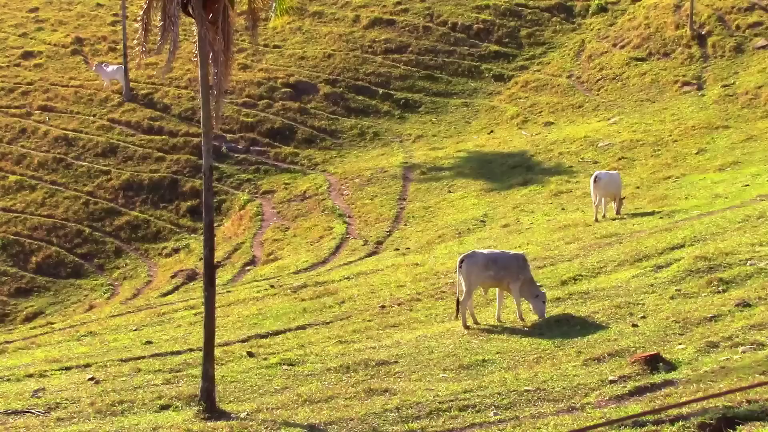

gado5.mp4 1920×1080 27.16s 25.00 FPS


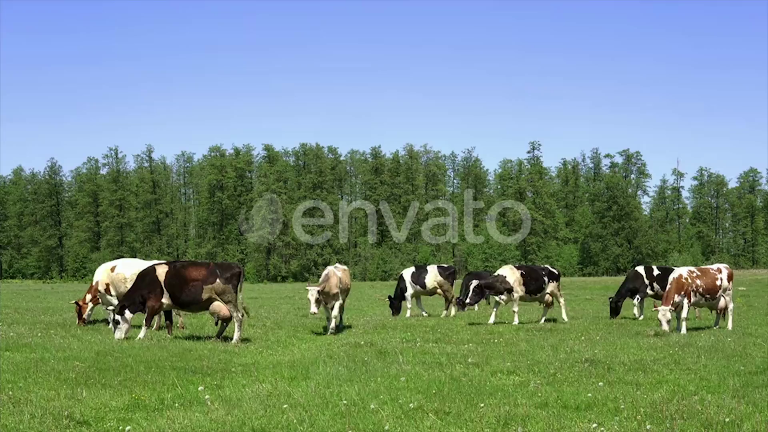

In [ ]:
try:
    from google.colab import files
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

VIDEO_DIR = Path(os.environ.get("VIGIAGADO_VIDEO_DIR", "/content" if IN_COLAB else "demo"))
def find_video(prefix):
    return next((p for p in sorted(VIDEO_DIR.glob("*"))
                 if p.is_file() and p.suffix.lower() == ".mp4" and p.name.lower().startswith(prefix)), None)
if IN_COLAB and (find_video("gado1") is None or find_video("gado5") is None):
    VIDEO_DIR.mkdir(parents=True, exist_ok=True)
    previous_directory = Path.cwd()
    os.chdir(VIDEO_DIR)
    try:
        files.upload()
    finally:
        os.chdir(previous_directory)
VIDEO_SANITY, VIDEO_MAIN = find_video("gado1"), find_video("gado5")
if VIDEO_SANITY is None or VIDEO_MAIN is None:
    raise FileNotFoundError("Envie gado1.mp4 e gado5.mp4; localmente coloque-os na pasta demo ou defina VIGIAGADO_VIDEO_DIR.")
RUN_DIR = Path(os.environ.get("VIGIAGADO_OUTPUT_DIR", "resultados")) / datetime.now().strftime("%Y%m%d_%H%M%S_%f")
RUN_DIR.mkdir(parents=True)
for path in [VIDEO_SANITY, VIDEO_MAIN]:
    cap = cv2.VideoCapture(str(path))
    ok, frame = cap.read()
    rate = cap.get(cv2.CAP_PROP_FPS)
    n = cap.get(cv2.CAP_PROP_FRAME_COUNT)
    cap.release()
    if not ok or rate <= 0:
        raise ValueError(f"Vídeo inválido: {path.name}")
    print(path.name, f"{frame.shape[1]}×{frame.shape[0]}", f"{n/rate:.2f}s", f"{rate:.2f} FPS")
    display(Image.fromarray(cv2.cvtColor(cv2.resize(frame, (768,432)), cv2.COLOR_BGR2RGB)))

## 6. YOLO pré-treinado
O modelo é `yolo11n.pt`. Procuramos a classe pelo nome para evitar um índice incorreto. O score exibido é a confiança produzida pelo detector, não uma probabilidade calibrada de certeza.

Na validação inicial, 640 pixels produziram omissões; 960 reduziu parte delas. O modelo permanece nano. Ajustar a resolução não garante que todos os animais serão vistos.

In [ ]:
MODEL, COW_IDS = load_model("yolo11n.pt")
print("Classe selecionada:", {i: MODEL.names[i] for i in COW_IDS})
CONFIDENCE = 0.25
IMAGE_SIZE = 960
PROCESS_FPS = 12

Classe selecionada: {19: 'cow'}


## 7. Detecção
As previsões fornecem coordenadas e confiança. O processamento seleciona somente a classe bovino. A conversão para 12 FPS mantém a duração aproximada do vídeo; a discrepância de arredondamento é inferior a um frame de saída.

In [ ]:
def detect_animals(model, cow_ids, frame, confidence=0.25, imgsz=640):
    result = model.predict(frame, classes=cow_ids, conf=confidence, imgsz=imgsz,
                           device=0 if torch.cuda.is_available() else "cpu", verbose=False)[0]
    return [{"xyxy": box.tolist(), "confidence": float(score)}
            for box, score in zip(result.boxes.xyxy.cpu().numpy(), result.boxes.conf.cpu().numpy())]

def draw_baseline(frame, detections, video_time_s):
    view = frame.copy()
    for det in detections:
        x1, y1, x2, y2 = map(int, det["xyxy"])
        cv2.rectangle(view, (x1, y1), (x2, y2), (70, 225, 120), 2)
        cv2.putText(view, f"Bovino {det['confidence']:.2f}", (x1, max(20, y1-8)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.55, (70, 225, 120), 2)
    view = cv2.copyMakeBorder(view, 90, 0, 0, 0, cv2.BORDER_CONSTANT, value=(26, 33, 24))
    cv2.putText(view, "VIGIAGADO  |  Validacao inicial", (22, 33), cv2.FONT_HERSHEY_SIMPLEX,
                0.8, (130, 235, 155), 2)
    cv2.putText(view, f"Tempo: {video_time_s:.2f}s   |   Bovinos visiveis: {len(detections)}",
                (22, 68), cv2.FONT_HERSHEY_SIMPLEX, 0.68, (245, 245, 245), 2)
    return view

## 8. Contagem e sanity check
A contagem é o número de detecções no frame atual. Não somamos contagens ao longo do vídeo. Esta etapa deve produzir o primeiro MP4 com boxes e contagem antes de executar o MVP completo.

In [ ]:
def process_baseline(source, output_dir, model=None, cow_ids=None, fps=12,
                     confidence=0.25, imgsz=640):
    source = Path(source).resolve()
    if not source.is_file():
        raise FileNotFoundError(f"Vídeo não encontrado: {source}")
    output_dir = Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)
    output = output_dir / "baseline.mp4"
    if source == output.resolve():
        raise ValueError("A saída não pode substituir o vídeo original.")
    if model is None:
        model, cow_ids = load_model()
    started = time.perf_counter()
    records = []
    with tempfile.TemporaryDirectory(prefix="vigiagado_") as temp:
        normalized = Path(temp) / "input.mp4"
        raw = Path(temp) / "render.mp4"
        normalize_video(source, normalized, fps=fps)
        cap = cv2.VideoCapture(str(normalized))
        if not cap.isOpened():
            raise ValueError("Não foi possível abrir o vídeo normalizado.")
        writer = None
        index = 0
        try:
            while True:
                ok, frame = cap.read()
                if not ok:
                    break
                detections = detect_animals(model, cow_ids, frame, confidence, imgsz)
                t = index / fps
                records.append({"frame": index, "video_time_s": t,
                                "count": len(detections), "detections": detections})
                rendered = draw_baseline(frame, detections, t)
                if writer is None:
                    writer = cv2.VideoWriter(str(raw), cv2.VideoWriter_fourcc(*"mp4v"), fps,
                                             (rendered.shape[1], rendered.shape[0]))
                    if not writer.isOpened():
                        raise RuntimeError("Falha ao iniciar o codificador de vídeo.")
                writer.write(rendered)
                if index % 24 == 0:
                    print(f"Baseline: frame {index}, t={t:.1f}s, bovinos={len(detections)}", flush=True)
                index += 1
        finally:
            cap.release()
            if writer is not None:
                writer.release()
        if not records:
            raise ValueError("O vídeo não produziu frames válidos.")
        encode_browser_video(raw, output)
    (output_dir / "detections.json").write_text(json.dumps(records, ensure_ascii=False))
    with (output_dir / "counts.csv").open("w", newline="", encoding="utf-8") as f:
        writer = csv.DictWriter(f, fieldnames=["frame", "video_time_s", "count"])
        writer.writeheader()
        writer.writerows({k: r[k] for k in writer.fieldnames} for r in records)
    summary = {"video": source.name, "frames": len(records), "fps": fps,
               "duration_s": len(records)/fps, "count_min": min(r["count"] for r in records),
               "count_max": max(r["count"] for r in records), "confidence": confidence,
               "imgsz": imgsz, "device": "cuda" if torch.cuda.is_available() else "cpu",
               "elapsed_s": round(time.perf_counter()-started, 3), "output": str(output)}
    (output_dir / "summary.json").write_text(json.dumps(summary, ensure_ascii=False, indent=2))
    return summary

In [ ]:
BASELINE = process_baseline(VIDEO_SANITY, RUN_DIR / "gado1", MODEL, COW_IDS,
                            fps=PROCESS_FPS, confidence=CONFIDENCE, imgsz=IMAGE_SIZE)
display(pd.DataFrame([BASELINE]).drop(columns=["output"]))
display(Video(BASELINE["output"], embed=True, width=900))

Baseline: frame 0, t=0.0s, bovinos=2
Baseline: frame 24, t=2.0s, bovinos=2
Baseline: frame 48, t=4.0s, bovinos=3


,video,frames,fps,duration_s,count_min,count_max,confidence,imgsz,device,elapsed_s
0,gado1.mp4,66,12,5.5,2,3,0.25,960,cpu,31.96


## 9. Danger Zone retangular
A ROI é definida em frações da imagem: esquerda, topo, direita e base, entre 0 e 1. A referência espacial é `((x1+x2)/2, y2)`; a borda pertence à zona. A prévia mostra a posição antes de processar o vídeo.

Bottom-center é uma aproximação da posição no solo para a perspectiva deste vídeo. Vegetação, postura e oclusão podem deslocar esse ponto. A ROI não acompanha uma câmera móvel.

In [ ]:
def rectangle_pixels(roi, frame_shape):
    """ROI normalizada (esquerda, topo, direita, base), relativa à imagem original."""
    if len(roi) != 4 or not all(np.isfinite(v) and 0 <= v <= 1 for v in roi):
        raise ValueError("ROI: informe quatro números entre 0 e 1.")
    left, top, right, bottom = roi
    if left >= right or top >= bottom:
        raise ValueError("ROI: esquerda < direita e topo < base.")
    h, w = frame_shape[:2]
    return (left * w, top * h, right * w, bottom * h)

def is_inside_zone(xyxy, rectangle):
    x1, _, x2, y2 = xyxy
    x, y = (x1 + x2) / 2, y2
    left, top, right, bottom = rectangle
    return left <= x <= right and top <= y <= bottom

def draw_zone(frame, detections, roi):
    view = frame.copy()
    rect = rectangle_pixels(roi, view.shape)
    flags = [is_inside_zone(d["xyxy"], rect) for d in detections]
    color = (75, 90, 245) if any(flags) else (45, 195, 245)
    layer = view.copy()
    cv2.rectangle(layer, tuple(map(int, rect[:2])), tuple(map(int, rect[2:])), color, -1)
    view = cv2.addWeighted(layer, 0.18, view, 0.82, 0)
    cv2.rectangle(view, tuple(map(int, rect[:2])), tuple(map(int, rect[2:])), color, 2)
    cv2.putText(view, "ZONA SIMULADA", (int(rect[0]), max(20, int(rect[1])-10)),
                cv2.FONT_HERSHEY_SIMPLEX, 0.55, color, 2)
    for det, inside in zip(detections, flags):
        x1, y1, x2, y2 = map(int, det["xyxy"])
        c = (70, 90, 255) if inside else (70, 225, 120)
        cv2.rectangle(view, (x1, y1), (x2, y2), c, 2)
        cv2.rectangle(view, (x1, max(0, y1-22)), (min(view.shape[1]-1, x1+137), y1), (23, 31, 22), -1)
        cv2.putText(view, f"Bovino {det['confidence']:.2f}", (x1+3, max(15, y1-5)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.48, c, 1)
        cv2.circle(view, ((x1+x2)//2, y2), 5, c, -1)
    return view, sum(flags)

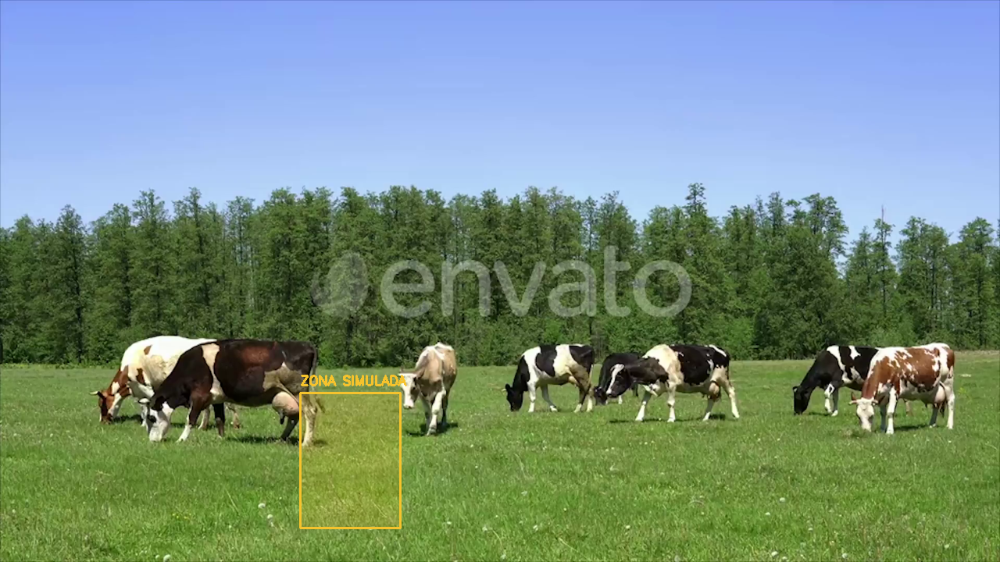

In [ ]:
# Edite estes campos no Colab ou diretamente nesta célula.
ROI_LEFT = 0.30 #@param {type:"number"}
ROI_TOP = 0.70 #@param {type:"number"}
ROI_RIGHT = 0.40 #@param {type:"number"}
ROI_BOTTOM = 0.94 #@param {type:"number"}
ROI = (ROI_LEFT, ROI_TOP, ROI_RIGHT, ROI_BOTTOM)
cap = cv2.VideoCapture(str(VIDEO_MAIN))
ok, preview = cap.read()
cap.release()
if not ok:
    raise ValueError("Não foi possível criar a prévia.")
preview = cv2.resize(preview, (1280,720))
rectangle_pixels(ROI, preview.shape)
preview, _ = draw_zone(preview, [], ROI)
display(Image.fromarray(cv2.cvtColor(preview, cv2.COLOR_BGR2RGB)))

## 10. Eventos agregados
A presença precisa persistir por 0,25 s para abrir um evento. Sua ausência nas detecções precisa persistir por 0,75 s para encerrar a observação. Essas configurações são heurísticas de demonstração.

A permanência não gera uma nova entrada por frame. O término registra **presença deixou de ser detectada**, sem concluir saída física. Um episódio ativo no fim do vídeo permanece com término desconhecido. Registramos início observado e confirmação separadamente.

In [ ]:
class TemporalState:
    """Confirma mudanças após persistência; uma transição gera um único evento."""
    def __init__(self, enter_s=0.25, clear_s=0.75):
        if enter_s < 0 or clear_s < 0:
            raise ValueError("Tempos de confirmação devem ser não negativos.")
        self.enter_s, self.clear_s = enter_s, clear_s
        self.active = False
        self.candidate_since = None

    def update(self, observed, time_s):
        observed = bool(observed)
        if observed == self.active:
            self.candidate_since = None
            return None
        if self.candidate_since is None:
            self.candidate_since = time_s
        delay = self.enter_s if observed else self.clear_s
        if time_s - self.candidate_since + 1e-9 < delay:
            return None
        change = {"active": observed, "onset_s": round(self.candidate_since, 4),
                  "confirmed_s": round(time_s, 4)}
        self.active = observed
        self.candidate_since = None
        return change

## 11. Divergência visual
Informe a quantidade esperada **na área visível**, não o total de animais da fazenda. O valor 7 abaixo é uma referência configurada para a demonstração, não uma contagem real certificada de todo o vídeo.

Uma diferença maior que a tolerância, persistindo por 2 s, ativa o aviso: **Possível divergência na contagem visual — recomenda-se verificação.** O retorno exige 1 s de compatibilidade. Não há reconhecimento individual nem diagnóstico de animal perdido.

In [ ]:
def validate_expected_count(expected_count, tolerance=0):
    if expected_count is not None and (isinstance(expected_count, bool) or
                                      int(expected_count) != expected_count or expected_count < 0):
        raise ValueError("expected_count deve ser inteiro >= 0 ou None.")
    if tolerance < 0 or int(tolerance) != tolerance:
        raise ValueError("A tolerância deve ser um inteiro >= 0.")

def count_differs(observed_count, expected_count, tolerance=0):
    return expected_count is not None and abs(observed_count - expected_count) > tolerance

In [ ]:
EXPECTED_COUNT = 7 #@param {type:"integer"}
COMPARE_COUNT = True #@param {type:"boolean"}
TOLERANCE = 0 #@param {type:"integer"}
DIVERGENCE_SECONDS = 2.0 #@param {type:"number"}
EXPECTED = EXPECTED_COUNT if COMPARE_COUNT else None
validate_expected_count(EXPECTED, TOLERANCE)

## 12. Processamento completo
O painel é acrescentado acima da imagem, preservando o enquadramento e a marca d'água. Círculos indicam bottom-center; detecções dentro da ROI são destacadas. O vídeo de saída é silencioso.

Os parâmetros configuráveis alteram o comportamento do produto, não treinam o modelo. As tabelas, evidências e vídeo são salvos na mesma pasta da execução.

In [ ]:
@lru_cache(maxsize=8)
def dashboard_font(size):
    for path in ["/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf",
                 "/usr/share/fonts/truetype/liberation2/LiberationSans-Regular.ttf"]:
        if Path(path).exists():
            return ImageFont.truetype(path, size)
    return ImageFont.load_default()

def draw_dashboard(frame, detections, roi, expected_count, video_time_s,
                   zone_active, divergence_active, tolerance=0):
    view, zone_count = draw_zone(frame, detections, roi)
    w = view.shape[1]
    # O painel é acrescentado acima da imagem: não encobre a marca d'água.
    panel = Image.new("RGB", (1280, 164), (18, 31, 26))
    draw = ImageDraw.Draw(panel)
    draw.text((22, 12), "VIGIAGADO", font=dashboard_font(26), fill=(136, 230, 160))
    draw.text((238, 21), "Monitoramento da área visível", font=dashboard_font(17), fill=(225, 235, 229))
    draw.text((914, 21), f"VÍDEO GRAVADO  •  {video_time_s:05.2f}s", font=dashboard_font(16), fill=(177, 196, 186))
    diff = None if expected_count is None else len(detections)-expected_count
    for x, label, value in [(22,"VISÍVEIS AGORA",len(detections)), (217,"ESPERADOS",expected_count),
                             (395,"DIFERENÇA",None if diff is None else f"{diff:+d}"), (585,"NA ZONA",zone_count)]:
        draw.text((x, 58), label, font=dashboard_font(12), fill=(173, 194, 183))
        draw.text((x, 77), "—" if value is None else str(value), font=dashboard_font(35), fill=(247, 250, 248))
    if zone_count:
        zone_text = "ALERTA: PRESENÇA NA ZONA" if zone_active else "PRESENÇA EM CONFIRMAÇÃO"
        color = (255, 142, 124)
    elif zone_active:
        zone_text, color = "PRESENÇA NÃO OBSERVADA AGORA", (247, 204, 111)
    else:
        zone_text, color = "SEM PRESENÇA DETECTADA", (189, 213, 197)
    draw.text((785, 58), zone_text, font=dashboard_font(17), fill=color)
    if expected_count is None:
        count_text = "Comparação de contagem desativada"
    elif divergence_active:
        count_text = "Possível divergência na contagem visual"
    elif count_differs(len(detections), expected_count, tolerance):
        count_text = "Verificando persistência da diferença"
    else:
        count_text = "Contagem visual compatível"
    draw.text((785, 86), count_text, font=dashboard_font(17), fill=(247, 204, 111) if divergence_active else (225, 235, 229))
    draw.text((785, 113), "Recomenda-se verificação." if divergence_active else "Referência configurada para esta área.",
              font=dashboard_font(14), fill=(177, 196, 186))
    draw.text((22, 139), "Protótipo acadêmico • Contagem visual estimada • Zona simulada • Ausência de detecção não comprova ausência física",
              font=dashboard_font(12), fill=(156, 179, 165))
    panel = panel.resize((w, int(round(164*w/1280/2))*2))
    return np.vstack([cv2.cvtColor(np.asarray(panel), cv2.COLOR_RGB2BGR), view])

In [ ]:
def process_video(source, output_dir, roi=(.30,.70,.40,.94), expected_count=7,
                  confidence=.25, imgsz=960, fps=12, tolerance=0,
                  zone_enter_s=.25, zone_clear_s=.75, divergence_s=2.0,
                  model=None, cow_ids=None):
    """MVP: arquivo → detecções → regras agregadas → vídeo e tabelas."""
    validate_expected_count(expected_count, tolerance)
    rectangle_pixels(roi, (720,1280,3))
    if not 1 <= fps <= 60 or not 0 < confidence <= 1:
        raise ValueError("Use FPS entre 1 e 60 e confiança entre 0 e 1.")
    if imgsz < 32 or int(imgsz) != imgsz:
        raise ValueError("imgsz deve ser inteiro >= 32.")
    source, output_dir = Path(source).resolve(), Path(output_dir)
    if not source.is_file():
        raise FileNotFoundError(f"Vídeo não encontrado: {source}")
    output_dir.mkdir(parents=True, exist_ok=True)
    output = output_dir / "VigiaGado_demo.mp4"
    if source == output.resolve() or output.exists():
        raise ValueError("Escolha uma pasta nova para preservar os arquivos existentes.")
    evidence_dir = output_dir / "evidencias"
    evidence_dir.mkdir(exist_ok=True)
    zone_state = TemporalState(zone_enter_s, zone_clear_s)
    diff_state = TemporalState(divergence_s, 1.0)
    if model is None:
        model, cow_ids = load_model()
    started = time.perf_counter()
    records, events, episodes = [], [], []
    current_episode = None
    with tempfile.TemporaryDirectory(prefix="vigiagado_") as temp:
        normalized, raw = Path(temp)/"input.mp4", Path(temp)/"render.mp4"
        normalize_video(source, normalized, fps=fps)
        cap = cv2.VideoCapture(str(normalized))
        if not cap.isOpened():
            raise ValueError("Falha na abertura do vídeo.")
        expected_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        writer, index = None, 0
        try:
            while True:
                ok, frame = cap.read()
                if not ok:
                    break
                t = index/fps
                detections = detect_animals(model, cow_ids, frame, confidence, imgsz)
                rectangle = rectangle_pixels(roi, frame.shape)
                zone_count = sum(is_inside_zone(d["xyxy"], rectangle) for d in detections)
                zone_change = zone_state.update(zone_count > 0, t)
                diff_change = diff_state.update(count_differs(len(detections), expected_count, tolerance), t)
                changes = []
                if zone_change:
                    kind = "presenca_iniciada" if zone_change["active"] else "presenca_deixou_de_ser_detectada"
                    changes.append((kind, zone_change))
                    if zone_change["active"]:
                        current_episode = {"episode":len(episodes)+1,"start_s":zone_change["onset_s"],
                                           "confirmed_start_s":t,"end_s":None,"confirmed_end_s":None,
                                           "peak_zone_count":zone_count,"status":"aberto"}
                        episodes.append(current_episode)
                    elif current_episode:
                        current_episode.update(end_s=zone_change["onset_s"],confirmed_end_s=t,
                                               status="presenca_deixou_de_ser_detectada")
                        current_episode = None
                if current_episode:
                    current_episode["peak_zone_count"] = max(current_episode["peak_zone_count"], zone_count)
                if diff_change:
                    changes.append(("divergencia_iniciada" if diff_change["active"] else "contagem_compativel",
                                    diff_change))
                rendered = draw_dashboard(frame, detections, roi, expected_count, t,
                                          zone_state.active, diff_state.active, tolerance)
                if writer is None:
                    writer = cv2.VideoWriter(str(raw), cv2.VideoWriter_fourcc(*"mp4v"), fps,
                                             (rendered.shape[1],rendered.shape[0]))
                    if not writer.isOpened():
                        raise RuntimeError("Falha no codificador de vídeo.")
                writer.write(rendered)
                for kind, change in changes:
                    name = f"evento_{len(events)+1:03d}_{kind}.jpg"
                    if not cv2.imwrite(str(evidence_dir/name), rendered):
                        raise RuntimeError("Não foi possível salvar a evidência.")
                    events.append({"event":len(events)+1,"type":kind,"video_time_s":change["onset_s"],
                                   "confirmed_at_s":change["confirmed_s"],"frame":index,"count":len(detections),
                                   "zone_count":zone_count,"expected_count":expected_count,"evidence":f"evidencias/{name}"})
                records.append({"frame":index,"video_time_s":round(t,4),"count":len(detections),
                                "zone_count":zone_count,"zone_active":zone_state.active,
                                "difference":None if expected_count is None else len(detections)-expected_count,
                                "divergence_active":diff_state.active,"detections":detections})
                if index % (fps*8) == 0:
                    cv2.imwrite(str(output_dir/f"frame_{index:04d}.jpg"),rendered)
                if index % 60 == 0:
                    print(f"MVP: {index}/{expected_frames} frames | {t:.1f}s | bovinos={len(detections)} | zona={zone_count}",flush=True)
                index += 1
        finally:
            cap.release()
            if writer is not None:
                writer.release()
        if not records or (expected_frames > 0 and len(records) != expected_frames):
            raise RuntimeError(f"Leitura incompleta: {len(records)} de {expected_frames} frames; resultado não finalizado.")
        if current_episode:
            current_episode["status"] = "aberto_ao_fim_do_video"
        encode_browser_video(raw, output)
    write_csv(output_dir/"contagens.csv",records,["frame","video_time_s","count","zone_count","zone_active","difference","divergence_active"])
    write_csv(output_dir/"eventos.csv",events,["event","type","video_time_s","confirmed_at_s","frame","count","zone_count","expected_count","evidence"])
    write_csv(output_dir/"episodios.csv",episodes,["episode","start_s","confirmed_start_s","end_s","confirmed_end_s","peak_zone_count","status"])
    (output_dir/"detections.json").write_text(json.dumps(records,ensure_ascii=False))
    summary = {"video":source.name,"frames":len(records),"fps":fps,"duration_s":len(records)/fps,
               "count_min":min(r["count"] for r in records),"count_max":max(r["count"] for r in records),
               "zone_episodes":len(episodes),"event_records":len(events),"expected_count":expected_count,
               "roi":list(roi),"confidence":confidence,"imgsz":imgsz,"tolerance":tolerance,
               "zone_enter_s":zone_enter_s,"zone_clear_s":zone_clear_s,"divergence_s":divergence_s,
               "device":"cuda" if torch.cuda.is_available() else "cpu",
               "elapsed_s":round(time.perf_counter()-started,3),"output":str(output),
               "divergence_active_at_end":diff_state.active,"zone_active_at_end":zone_state.active,
               "note":"Contagem visual estimada. Ausência de detecção não comprova ausência física."}
    (output_dir/"resumo.json").write_text(json.dumps(summary,ensure_ascii=False,indent=2))
    return summary

In [ ]:
FINAL = process_video(VIDEO_MAIN, RUN_DIR / "gado5", roi=ROI, expected_count=EXPECTED,
                      confidence=CONFIDENCE, imgsz=IMAGE_SIZE, fps=PROCESS_FPS,
                      tolerance=TOLERANCE, divergence_s=DIVERGENCE_SECONDS,
                      model=MODEL, cow_ids=COW_IDS)
print("Processamento concluído:", FINAL["output"])

MVP: 0/326 frames | 0.0s | bovinos=8 | zona=0
MVP: 60/326 frames | 5.0s | bovinos=9 | zona=0
MVP: 120/326 frames | 10.0s | bovinos=10 | zona=1
MVP: 180/326 frames | 15.0s | bovinos=9 | zona=1
MVP: 240/326 frames | 20.0s | bovinos=9 | zona=1
MVP: 300/326 frames | 25.0s | bovinos=10 | zona=1
Processamento concluído: resultados/20260913_170847_606061/gado5/VigiaGado_demo.mp4


## 13. Resultado e download
Os números são observações do detector. A tabela de episódios não representa contagem de animais únicos. As evidências correspondem ao instante de confirmação.

Baixe o ZIP: a sessão do Colab não é armazenamento permanente. A criação deste arquivo não autoriza a publicação dos vídeos de terceiros.

In [ ]:
display(Video(FINAL["output"], embed=True, width=1000))
MAIN_DIR = Path(FINAL["output"]).parent
COUNTS = pd.read_csv(MAIN_DIR / "contagens.csv")
EVENTS = pd.read_csv(MAIN_DIR / "eventos.csv")
EPISODES = pd.read_csv(MAIN_DIR / "episodios.csv")
display(pd.DataFrame([{k:v for k,v in FINAL.items() if k not in {"output","roi","note"}}]))
display(EVENTS)
display(EPISODES)
ZIP_RESULTS = shutil.make_archive(str(RUN_DIR) + "_resultados", "zip", RUN_DIR)
print("Resultados:", ZIP_RESULTS)
if IN_COLAB:
    files.download(ZIP_RESULTS)

,video,frames,fps,duration_s,count_min,count_max,zone_episodes,event_records,expected_count,confidence,imgsz,tolerance,zone_enter_s,zone_clear_s,divergence_s,device,elapsed_s,divergence_active_at_end,zone_active_at_end
0,gado5.mp4,326,12,27.166667,7,10,2,4,7,0.25,960,0,0.25,0.75,2.0,cpu,140.461,True,True


,event,type,video_time_s,confirmed_at_s,frame,count,zone_count,expected_count,evidence
0,1,divergencia_iniciada,3.9167,5.9167,71,10,0,7,evidencias/evento_001_divergencia_iniciada.jpg
1,2,presenca_iniciada,9.9167,10.1667,122,9,1,7,evidencias/evento_002_presenca_iniciada.jpg
2,3,presenca_deixou_de_ser_detectada,10.6667,11.4167,137,8,0,7,evidencias/evento_003_presenca_deixou_de_ser_d...
3,4,presenca_iniciada,13.2500,13.5000,162,7,1,7,evidencias/evento_004_presenca_iniciada.jpg


,episode,start_s,confirmed_start_s,end_s,confirmed_end_s,peak_zone_count,status
0,1,9.9167,10.166667,10.6667,11.416667,1,presenca_deixou_de_ser_detectada
1,2,13.2500,13.500000,NaN,NaN,1,aberto_ao_fim_do_video


Resultados: /content/resultados/20260913_170847_606061_resultados.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 14. Dataset público
**Selecionado: ILVO / XGain — Computer Vision Dataset for Detecting Cattle Behaviors in Pasture Environments.**

[Fonte e autores](https://zenodo.org/records/15688349). Dados de pastagem com boxes no formato YOLO. A inspeção do índice realizada neste projeto identificou **1.657 imagens e 1.658 arquivos TXT**; quantidade de arquivos não comprova qualidade das anotações. O ZIP tem aproximadamente 946 MB.

**Licença:** o aviso de copyright registra CC BY-NC 4.0, enquanto o campo de metadados registra CC BY 4.0. Adotar a restrição não comercial nesta atividade e registrar a inconsistência; não distribuir os dados junto ao repositório. A licença do código não substitui a das imagens.

O download integral retornou HTTP 504 neste ambiente. Uma tentativa com COCO128 foi rejeitada após a auditoria encontrar **zero anotações cow**. O download de anotações COCO também falhou com HTTP 502. Nenhum desses conjuntos foi usado como se fosse treinamento concluído. A célula opcional abaixo permite baixar ou usar um ZIP ILVO já enviado ao Colab, visualizar amostras e preservar as anotações originais. Uma falha nesta seção não apaga a demonstração pronta.

**Sem fine-tuning nesta entrega.** A análise integral das classes, preparação do split e métricas de detecção sobre esse dataset continuam pendentes até obter e conferir os dados.

In [ ]:
import zipfile, requests, hashlib
RUN_DATASET_AUDIT = False #@param {type:"boolean"}
DATASET_ZIP = "ilvo.zip" #@param {type:"string"}
DATASET_URL = "https://zenodo.org/api/records/15688349/files/WP5_T5.7_Livestock%20images_and%20labels_EVILVO_dataset.zip/content"
DATASET_REPORT = {"status":"não executado nesta sessão"}
if RUN_DATASET_AUDIT:
    try:
        archive = Path(DATASET_ZIP)
        if not archive.exists():
            partial = archive.with_suffix(".part")
            print("Baixando aproximadamente 946 MB. Também é possível enviar o ZIP manualmente.")
            with requests.get(DATASET_URL, stream=True, timeout=(15,30)) as response:
                response.raise_for_status()
                with partial.open("wb") as f:
                    for chunk in response.iter_content(1024*1024):
                        if chunk:
                            f.write(chunk)
            partial.replace(archive)
        digest = hashlib.md5()
        with archive.open("rb") as f:
            for block in iter(lambda:f.read(1024*1024), b""):
                digest.update(block)
        if digest.hexdigest() != "41c3643a4e9d0b19a88ea1b70d2d8175":
            raise ValueError("Checksum diferente do arquivo ILVO publicado; não utilizar como a versão esperada.")
        sample_dir = RUN_DIR / "dataset_amostra"
        sample_dir.mkdir(exist_ok=True)
        with zipfile.ZipFile(archive) as z:
            members = [n for n in z.namelist() if not n.endswith("/") and "__MACOSX" not in n]
            images = [n for n in members if Path(n).suffix.lower() in {".jpg",".jpeg",".png"}]
            labels = {Path(n).stem:n for n in members if n.endswith(".txt")}
            print("Imagens:",len(images),"TXT:",len(labels))
            for n in members:
                if n.endswith(".txt") and Path(n).stem not in {Path(i).stem for i in images}:
                    print(Path(n).name, z.read(n).decode("utf-8",errors="replace")[:3000])
            audit=[]
            chosen = images[::max(1,len(images)//6)][:6]
            for name in chosen:
                stem = Path(name).stem
                if stem not in labels:
                    audit.append({"image":name,"status":"rótulo ausente"})
                    continue
                raw_image, raw_label = z.read(name), z.read(labels[stem])
                (sample_dir/Path(name).name).write_bytes(raw_image)
                (sample_dir/(stem+".txt")).write_bytes(raw_label)
                image = cv2.imdecode(np.frombuffer(raw_image,np.uint8),cv2.IMREAD_COLOR)
                if image is None:
                    raise ValueError("Imagem inválida: "+name)
                h,w=image.shape[:2]
                rows = [list(map(float,line.split())) for line in raw_label.decode().splitlines() if line.strip()]
                for row in rows:
                    if len(row)!=5 or int(row[0])!=row[0] or not all(0<=v<=1 for v in row[1:]) or row[3]<=0 or row[4]<=0:
                        raise ValueError("Anotação inválida: "+name)
                    cls,x,y,bw,bh=row
                    cv2.rectangle(image,(int((x-bw/2)*w),int((y-bh/2)*h)),(int((x+bw/2)*w),int((y+bh/2)*h)),(0,230,80),2)
                display(Image.fromarray(cv2.cvtColor(cv2.resize(image,(768,432)),cv2.COLOR_BGR2RGB)))
                audit.append({"image":name,"boxes":len(rows),"status":"amostra extraída; conferir visualmente"})
        DATASET_REPORT={"status":"amostra disponível","images_in_archive":len(images),"samples":audit,"md5":digest.hexdigest()}
        (sample_dir/"auditoria.json").write_text(json.dumps(DATASET_REPORT,ensure_ascii=False,indent=2))
        display(pd.DataFrame(audit))
    except Exception as error:
        DATASET_REPORT={"status":"falha na auditoria", "error":str(error)}
        print("Auditoria não concluída:",error)
        print("O vídeo e as tabelas do MVP continuam na pasta de resultados.")
else:
    print("Auditoria opcional desativada. As limitações e tentativas estão documentadas acima.")

Auditoria opcional desativada. As limitações e tentativas estão documentadas acima.


## 15. Avaliação disponível
**Testado no ambiente local com CPU:** gado1 — 66 frames, 5,5 s, contagem 2–3; gado5 — 326 frames, 27,17 s, contagem 7–10, dois episódios e quatro registros de eventos. O gado5 levou 42,886 s de processamento naquela execução. Tempo depende do hardware; não é promessa para o Colab.

A ROI, o estado temporal e a comparação de contagem foram exercitados nos cenários abaixo. Estes são testes funcionais, não estimativas de Precision/Recall em campo.

| Cenário | Comportamento esperado |
|---|---|
| Ponto fora / na borda / dentro | Fora sem presença; borda e interior incluídos |
| Presença persistente | Uma abertura de evento |
| Permanência | Não repetir abertura |
| Ausência breve | Não duplicar episódio |
| Ausência persistente | Encerrar observação, sem afirmar saída física |
| Diferença breve / persistente | Aguardar / sinalizar divergência |
| Referência zero ou desativada | Sem divisão por zero; comparação opcional |

Precision, Recall, mAP@50 e mAP@50–95 **não foram medidos**. Faltou um conjunto de detecção auditado; não apresentamos números inventados. mAP avalia detecção/localização e não equivale ao acerto da contagem. Confiança do detector também não é uma métrica global de qualidade.

A contagem 7 configurada no gado5 é parâmetro do cenário, não ground truth. Os dois episódios registrados não comprovam duas entradas físicas distintas. Erros de box perto da borda podem fragmentar uma mesma presença.

In [ ]:
# Verificações pequenas de contrato, independentes do YOLO.
r = rectangle_pixels((.3,.7,.4,.94), (720,1280,3))
assert is_inside_zone([400,300,500,600], r)
assert not is_inside_zone([10,20,30,40], r)
assert is_inside_zone([r[0]-10,400,r[0]+10,r[1]], r)
s = TemporalState(.25,.75)
changes=[]
for t,present in [(0,False),(.25,True),(.5,True),(.75,True),(1,False),(1.25,True),(1.5,False),(2,False),(2.25,False)]:
    change=s.update(present,t)
    if change:
        changes.append(change)
assert [c["active"] for c in changes] == [True,False]
assert not count_differs(0,0)
assert count_differs(1,0)
assert not count_differs(3,None)
assert not count_differs(6,7,1)
d = TemporalState(2,1)
assert d.update(True,0) is None
assert d.update(True,1) is None
assert d.update(True,2)["active"]
assert d.update(False,3) is None
assert not d.update(False,4)["active"]
print("Geometria, transições, persistência e comparação de contagem: verificações aprovadas.")

Geometria, transições, persistência e comparação de contagem: verificações aprovadas.


## 16. Limitações
- Cobertura restrita à imagem; animais fora de quadro não são localizados.
- Oclusão, sobreposição, distância, vegetação e iluminação afetam o detector.
- A contagem pode conter falsos positivos, omissões e boxes duplicadas.
- Bottom-center e ROI representam uma aproximação 2D.
- Confirmação temporal reduz oscilações e acrescenta atraso; passagens curtas podem ser perdidas.
- Ausência de detecção não comprova ausência física; coincidência de contagem não comprova inventário correto.
- Vídeo gravado não representa monitoramento em tempo real.
- Sem avaliação de campo ou promessa de redução de acidentes/prejuízos.
- Os vídeos anexados não têm licença de redistribuição verificada.

[Referência: Ultralytics](https://docs.ultralytics.com/models/yolo11/) • [Métricas](https://docs.ultralytics.com/guides/yolo-performance-metrics/) • [Colab](https://research.google.com/colaboratory/faq.html)

## 17. Interface de demonstração
A interface desta entrega é o próprio notebook: upload, campos de configuração, prévia da ROI, botão de execução da célula, vídeo, tabelas e download. **Gradio não foi implementado.** Assim, a apresentação não depende de túnel ou serviço de hospedagem.

Para uma demonstração curta, mostre a saída pronta, altere a ROI e processe o vídeo novamente se houver tempo. Não é necessário retreinar.

## 18. Conclusão e próximos passos
O VigiaGado converte a percepção do detector em contagem contextualizada, eventos e evidência revisável. O MVP funciona com modelo pré-treinado e regras simples.

Próximos passos: concluir auditoria do dataset, anotar eventos/contagens de referência, medir o detector e o produto em cenas independentes e só então avaliar fine-tuning e tracking. Câmeras IP, notificações, múltiplas câmeras, biometria e implantação contínua ficam fora desta entrega.